In [1]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import os
from pathlib import Path

import geopandas as gpd
import numpy as np
import pandas as pd
import pygmt
import pyogrio
import verde as vd
import xarray as xr
from polartoolkit import fetch, maps, regions, utils
from invert4geom import utils as inv_utils
import RIS_gravity_inversion.plotting as RIS_plotting
from RIS_gravity_inversion import ice_shelf_stats
import zarr
from tqdm.autonotebook import tqdm

import logging
logging.getLogger().setLevel(logging.INFO)

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

# Antarctic Ice Shelf bathymetry contraint density
Here we analyze the major Antarctic ice shelves and calculate the spatial density of direct measurements of bathymetry depths. These measurements are restricted to drill holes with direct observations of water depth, and seismic survey's with accurate bed returns.  

## fetch datasets

In [2]:
spacing = 1e3

# datasets which don't need resampling
imagery = fetch.imagery()
mass_change = fetch.mass_change(version="ais_dhdt_floating_filt")
ice_vel = fetch.ice_vel()
basal_melt = fetch.basal_melt().rename({"northing": "y", "easting": "x"})
buttressing = fetch.buttressing(variable='max')

INFO:root:using preprocessed 5km grid since spacing is > 5km
INFO:root:returning original grid
INFO:root:returning original grid


In [3]:
# # resample data to specified spacing, then save to local zarr files to load faster
# bed = fetch.bedmachine(layer="bed", spacing=spacing)
# surface = fetch.bedmachine(layer="surface", spacing=spacing)
# thickness = fetch.bedmachine(layer="thickness", spacing=spacing)
# bedmap_bed = fetch.bedmap2(layer="bed", spacing=spacing)
# bedmap_icebase = fetch.bedmap2(layer="icebase", spacing=spacing)

# # save all to compressed zarr files
# compressor = zarr.Blosc(cname="zstd", clevel=3, shuffle=2)
# bed.rename("z").to_zarr(
#     "../../data/bed.zarr",
#     encoding={"z":{"compressor": compressor}},
#     mode='w',
# )
# surface.rename("z").to_zarr(
#     "../../data/surface.zarr",
#     encoding={"z":{"compressor": compressor}},
#     mode='w',
# )
# thickness.rename("z").to_zarr(
#    "../../data/thickness.zarr",
#     encoding={"z":{"compressor": compressor}},
#     mode='w',
# )
# bedmap_bed.rename("z").to_zarr(
#     "../../data/bedmap_bed.zarr",
#     encoding={"z":{"compressor": compressor}},
#     mode='w',
# )
# bedmap_icebase.rename("z").to_zarr(
#     "../../data/bedmap_icebase.zarr",
#     encoding={"z":{"compressor": compressor}},
#     mode='w',
# )

In [4]:
bed = xr.open_zarr("../../data/bed.zarr").z
surface = xr.open_zarr("../../data/surface.zarr").z
thickness = xr.open_zarr("../../data/thickness.zarr").z
bedmap_bed = xr.open_zarr("../../data/bedmap_bed.zarr").z
bedmap_icebase = xr.open_zarr("../../data/bedmap_icebase.zarr").z

In [5]:
# calculate from topography grids
icebase = surface - thickness

ocean_draft = icebase - bed
# ensure no negative thickness values
ocean_draft = xr.where(ocean_draft < 0, np.nan, ocean_draft)

## Ice shelf masks
Here we gather shapefiles for all of the Antarctic ice shelves.

In [6]:
ice_shelves = ice_shelf_stats.get_ice_shelves()
ice_shelves

INFO:RIS_gravity_inversion:Number of unmerged ice shelves: 180
INFO:RIS_gravity_inversion:Combining 2 Ronne_Filchner sub-shelves
INFO:RIS_gravity_inversion:Combining 7 Abbot sub-shelves
INFO:RIS_gravity_inversion:Combining 5 Wordie sub-shelves
INFO:RIS_gravity_inversion:Combining 3 Getz sub-shelves
INFO:RIS_gravity_inversion:Combining 2 Ross sub-shelves
INFO:RIS_gravity_inversion:Combining 2 Walgreen sub-shelves
INFO:RIS_gravity_inversion:Combining 2 Rydberg sub-shelves
INFO:RIS_gravity_inversion:Combining 2 LarsenD sub-shelves
INFO:RIS_gravity_inversion:Number of removed sub-shelves: 25
INFO:RIS_gravity_inversion:Number of merged ice shelves: 164


,NAME,Regions,TYPE,geometry,area_km
0,Ross,West,FL,"POLYGON ((-240677.184 -678259.006, -240038.274...",480428.0
1,Ronne_Filchner,West,FL,"POLYGON ((-1006734.891 880592.980, -1006335.92...",427042.0
2,Amery,East,FL,"POLYGON ((2134701.422 618463.117, 2131452.011 ...",60797.0
3,LarsenC,Peninsula,FL,"POLYGON ((-2235724.269 1271352.188, -2235828.5...",47444.0
4,Riiser-Larsen,East,FL,"POLYGON ((-592166.317 1592824.258, -593783.160...",42913.0
...,...,...,...,...,...
159,Perkins,West,FL,"POLYGON ((-1129608.753 -1201300.734, -1130034....",7.0
160,Rose_Point,West,FL,"POLYGON ((-1147927.179 -1208825.172, -1147730....",7.0
161,Arneb,East,FL,"POLYGON ((333867.825 -1897953.452, 333673.461 ...",6.0
162,Falkner,East,FL,"POLYGON ((425350.532 -1726631.609, 423726.753 ...",6.0


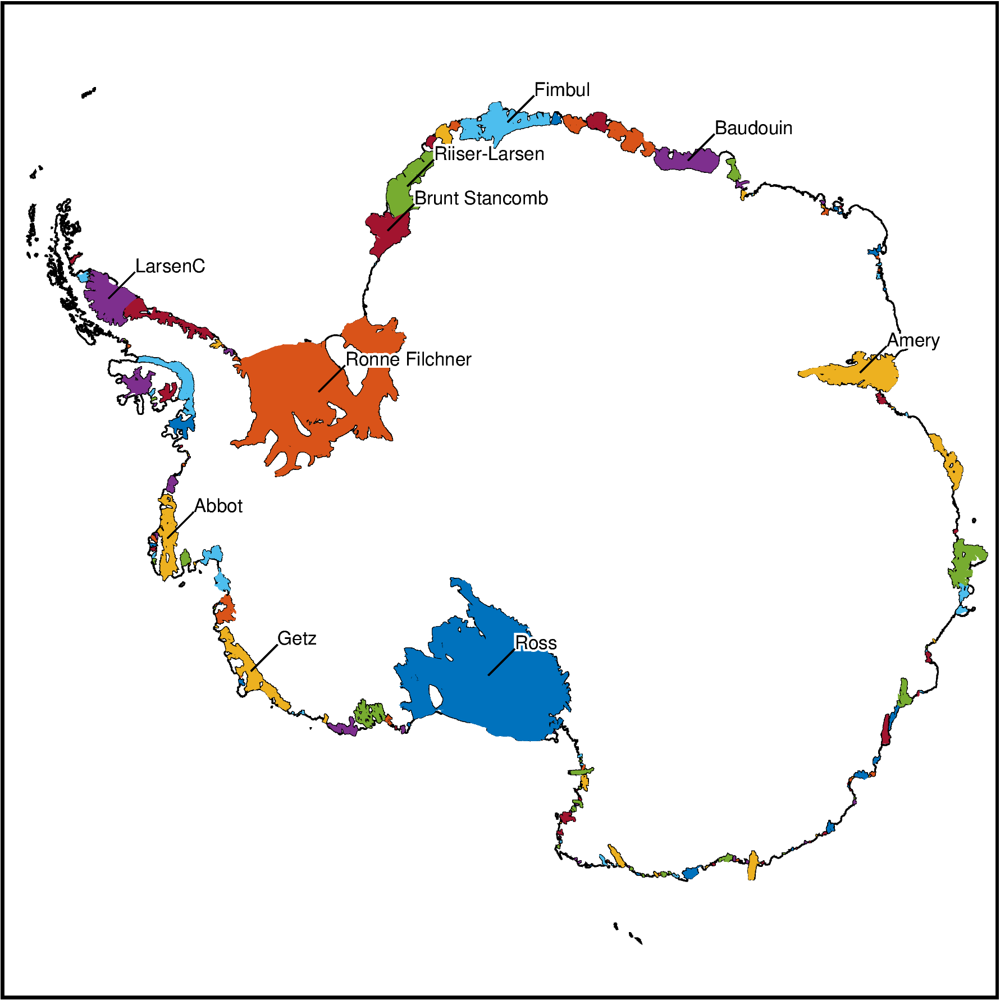

In [7]:
# choose how many ice shelves to plot
df = ice_shelves#.iloc[0:10]

# plot basemap with coastline and grounding lines
fig = maps.basemap(
    region=regions.antarctica,
    coast=True,
)

# plot ice shelves
fig.plot(
    df,
    close=True,
    fill="auto",
)

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:10])

fig.show()

## Get average grid values for each shelf
Ocean draft, basal melt, mass change, buttressing

In [8]:
# g = ocean_draft.rename("draft")

# pbar = tqdm(
#     ice_shelves[ice_shelves.NAME.isin(["Borchgrevink", "Brunt_Stancomb"])].iterrows(),
#     desc="Ice Shelves",
#     total=len(ice_shelves),
# )
# for i, row in pbar:
#     pbar.set_description(row.NAME)

#     # mask to the ice shelf outline
#     masked_grd = utils.mask_from_shp(
#         shapefile=row,
#         xr_grid=g,
#         invert=False,
#         masked=True,
#     )

#     # calculate stats
#     ice_shelves.loc[i, f"{g.name}_mean"] = masked_grd.mean().values
#     ice_shelves.loc[i, f"{g.name}_std"] = masked_grd.std().values
#     ice_shelves.loc[i, f"{g.name}_max"] = masked_grd.max().values
#     ice_shelves.loc[i, f"{g.name}_min"] = masked_grd.min().values
#     ice_shelves.loc[i, f"{g.name}_median"] = np.nanmedian(masked_grd)

# ice_shelves

In [9]:
# grids = [
#     ocean_draft.rename("ocean_draft"),
#     mass_change.rename("mass_change"),
#     ice_vel.rename("ice_vel"),
#     basal_melt.rename("basal_melt"),
#     buttressing.rename("buttressing"),
# ]


# for g in tqdm(grids):

#     # mask the grid to all ice shelves to reduce compute time
#     g = utils.mask_from_shp(
#         shapefile=ice_shelves,
#         xr_grid=g,
#         invert=False,
#         masked=True,
#     )

#     # convert dataarray to dataframe, dropping rows with nans
#     df = vd.grid_to_table(g).dropna(how="any").reset_index(drop=True)

#     # turn into geopandas geodataframe with points
#     gdf = gpd.GeoDataFrame(
#         df, geometry=gpd.points_from_xy(x=df.x, y=df.y), crs="3031"
#     )

#     # merge ocean draft point data and ice shelf polygons
#     merged = gpd.sjoin(gdf, ice_shelves, how="left")

#     # get stats for each ice shelf
#     stats_pt = merged.groupby("NAME").agg(
#         g_mean=(g.name, "mean"),
#         g_std=(g.name, "std"),
#         g_max=(g.name, "max"),
#         g_min=(g.name, "min"),
#         g_median=(g.name, "median"),
#     )
#     stats_pt = stats_pt.rename(
#         columns={
#             "g_mean": f"{g.name}_mean",
#             "g_std": f"{g.name}_std",
#             "g_max": f"{g.name}_max",
#             "g_min": f"{g.name}_min",
#             "g_median": f"{g.name}_median",
#         }
#     )
#     # merge stats back into ice shelf gdf
#     ice_shelves = pd.merge(
#         ice_shelves, stats_pt, left_on="NAME", right_index=True, how="outer"
#     )

# ice_shelves.head()

In [10]:
# # save to file
# ice_shelves.sort_values("area_km", ascending=False).reset_index(drop=True).to_csv("../../data/ice_shelf_grid_stats.csv", index=False,)

In [11]:
ice_shelves = pd.read_csv("../../data/ice_shelf_grid_stats.csv", index_col=None)

# turn back into geodataframe
ice_shelves = gpd.GeoDataFrame(
    ice_shelves,
    geometry=gpd.GeoSeries.from_wkt(ice_shelves['geometry'], crs="EPSG:3031"),
    crs="EPSG:3031",
)

ice_shelves.head()

,NAME,Regions,TYPE,geometry,area_km,ocean_draft_mean,ocean_draft_std,ocean_draft_max,ocean_draft_min,ocean_draft_median,...,basal_melt_mean,basal_melt_std,basal_melt_max,basal_melt_min,basal_melt_median,buttressing_mean,buttressing_std,buttressing_max,buttressing_min,buttressing_median
0,Ross,West,FL,"POLYGON ((-240677.184 -678259.006, -240038.274...",480428.0,260.65866,166.915270,899.82920,0.000000,256.58667,...,0.123017,0.815425,127.918576,-19.795664,0.058103,1.108353,2.639731,219.245460,-781.639450,0.972029
1,Ronne_Filchner,West,FL,"POLYGON ((-1006734.891 880592.980, -1006335.92...",427042.0,309.07706,186.777240,1200.28820,0.000061,300.22180,...,0.089360,1.439155,60.313785,-15.719558,0.007152,0.948317,0.331684,5.645059,-4.981122,1.004841
2,Amery,East,FL,"POLYGON ((2134701.422 618463.117, 2131452.011 ...",60797.0,445.00336,284.800750,1778.64820,0.000000,423.68127,...,0.732490,2.577522,54.461421,-5.384351,0.211047,0.939107,0.537243,50.728063,-2.656719,1.018257
3,LarsenC,Peninsula,FL,"POLYGON ((-2235724.269 1271352.188, -2235828.5...",47444.0,223.03781,116.794334,597.22205,0.000000,230.23009,...,1.379516,1.788408,64.367496,-13.595803,1.198390,0.845410,0.508456,7.820130,-7.390949,0.794518
4,Riiser-Larsen,East,FL,"POLYGON ((-592166.317 1592824.258, -593783.160...",42913.0,185.49048,178.388640,2477.71340,0.106323,169.05022,...,0.420335,1.041831,92.444759,-13.239013,0.277677,0.976415,0.624278,11.248174,-0.502140,0.957421


In [12]:
ice_shelf_stats_gdf = pd.read_csv("../../data/ice_shelf_gravity_stats.csv", index_col=None)

# turn back into geodataframe
ice_shelf_stats_gdf = gpd.GeoDataFrame(
    ice_shelf_stats_gdf,
    geometry=gpd.GeoSeries.from_wkt(ice_shelf_stats_gdf['geometry'], crs="EPSG:3031"),
    crs="EPSG:3031",
)

# turn into km
ice_shelf_stats_gdf["median_constraint_distance"] = ice_shelf_stats_gdf["median_constraint_distance"] / 1e3

ice_shelf_stats_gdf.head()

,NAME,Regions,TYPE,geometry,area_km,median_constraint_distance,gravity_disturbance_rms,gravity_disturbance_stdev,partial_topo_free_disturbance_rms,partial_topo_free_disturbance_stdev,...,reg_rms,reg_stdev,res_rms,res_stdev,error_rms,error_stdev,residual_constraint_proximity_ratio_rms,residual_constraint_proximity_ratio_stdev,regional_constraint_proximity_ratio_rms,regional_constraint_proximity_ratio_stdev
0,Ross,West,FL,"POLYGON ((-240677.184 -678259.006, -240038.274...",480428.0,16.438369,44.934094,14.663219,43.662103,14.661921,...,17.075245,16.697962,5.376152,5.361364,12.748633,3.154937,109411.809927,108973.906512,2.645335e+05,2.465043e+05
1,Ronne_Filchner,West,FL,"POLYGON ((-1006734.891 880592.980, -1006335.92...",427042.0,7.164803,41.514238,18.769872,41.429561,18.760552,...,33.720993,20.579190,3.460521,3.460078,7.952294,1.760702,51031.817496,51000.501525,3.285126e+05,2.353756e+05
2,Amery,East,FL,"POLYGON ((2134701.422 618463.117, 2131452.011 ...",60797.0,15.183931,54.607713,44.217952,55.333792,44.152812,...,38.045945,21.303547,14.573418,12.580467,8.435324,0.503457,422143.617186,382878.269956,1.003772e+06,7.182766e+05
3,LarsenC,Peninsula,FL,"POLYGON ((-2235724.269 1271352.188, -2235828.5...",47444.0,8.870497,14.847744,13.588458,14.444266,13.464743,...,38.109721,12.964762,5.318446,5.316355,5.718122,1.274370,65632.760934,65551.197575,4.938188e+05,3.113619e+05
4,Riiser-Larsen,East,FL,"POLYGON ((-592166.317 1592824.258, -593783.160...",42913.0,16.583215,53.516817,37.949582,52.971480,37.978854,...,76.811886,37.814496,11.198799,11.124435,8.282689,0.712841,332133.545228,331949.811620,1.767678e+06,1.152930e+06


In [13]:
ice_shelves = ice_shelves.merge(ice_shelf_stats_gdf, how="left")
ice_shelves

,NAME,Regions,TYPE,geometry,area_km,ocean_draft_mean,ocean_draft_std,ocean_draft_max,ocean_draft_min,ocean_draft_median,...,reg_rms,reg_stdev,res_rms,res_stdev,error_rms,error_stdev,residual_constraint_proximity_ratio_rms,residual_constraint_proximity_ratio_stdev,regional_constraint_proximity_ratio_rms,regional_constraint_proximity_ratio_stdev
0,Ross,West,FL,"POLYGON ((-240677.184 -678259.006, -240038.274...",480428.0,260.658660,166.915270,899.829200,0.000000,256.586670,...,17.075245,16.697962,5.376152e+00,5.361364e+00,12.748633,3.154937,109411.809927,108973.906512,2.645335e+05,2.465043e+05
1,Ronne_Filchner,West,FL,"POLYGON ((-1006734.891 880592.980, -1006335.92...",427042.0,309.077060,186.777240,1200.288200,0.000061,300.221800,...,33.720993,20.579190,3.460521e+00,3.460078e+00,7.952294,1.760702,51031.817496,51000.501525,3.285126e+05,2.353756e+05
2,Amery,East,FL,"POLYGON ((2134701.422 618463.117, 2131452.011 ...",60797.0,445.003360,284.800750,1778.648200,0.000000,423.681270,...,38.045945,21.303547,1.457342e+01,1.258047e+01,8.435324,0.503457,422143.617186,382878.269956,1.003772e+06,7.182766e+05
3,LarsenC,Peninsula,FL,"POLYGON ((-2235724.269 1271352.188, -2235828.5...",47444.0,223.037810,116.794334,597.222050,0.000000,230.230090,...,38.109721,12.964762,5.318446e+00,5.316355e+00,5.718122,1.274370,65632.760934,65551.197575,4.938188e+05,3.113619e+05
4,Riiser-Larsen,East,FL,"POLYGON ((-592166.317 1592824.258, -593783.160...",42913.0,185.490480,178.388640,2477.713400,0.106323,169.050220,...,76.811886,37.814496,1.119880e+01,1.112444e+01,8.282689,0.712841,332133.545228,331949.811620,1.767678e+06,1.152930e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159,Rose_Point,West,FL,"POLYGON ((-1147927.179 -1208825.172, -1147730....",7.0,77.945960,78.899530,196.716900,10.000000,39.044370,...,19.805753,0.589294,2.873603e+00,2.428152e+00,13.524648,0.287649,2784.396543,2089.018872,1.475005e+04,4.808885e+03
160,Perkins,West,FL,"POLYGON ((-1129608.753 -1201300.734, -1130034....",7.0,8.315606,3.970496,10.000000,0.212727,9.946823,...,25.029707,0.975564,7.612320e-01,6.095492e-01,8.757103,0.917573,815.726924,658.066937,2.512720e+04,6.331423e+03
161,Arneb,East,FL,"POLYGON ((333867.825 -1897953.452, 333673.461 ...",6.0,22.828428,25.674753,68.571120,0.226238,10.419937,...,72.517861,10.709236,4.577811e+00,3.836260e+00,14.502661,0.200468,4449.608717,3631.934312,4.377760e+04,1.954008e+04
162,Falkner,East,FL,"POLYGON ((425350.532 -1726631.609, 423726.753 ...",6.0,6.062190,6.133039,14.699677,0.000000,5.400552,...,37.795759,4.544636,1.033893e+01,7.583107e+00,13.782112,0.230442,7055.978937,5600.410731,3.084200e+04,9.409904e+03


In [14]:
ice_shelves.columns

Index(['NAME', 'Regions', 'TYPE', 'geometry', 'area_km', 'ocean_draft_mean',
       'ocean_draft_std', 'ocean_draft_max', 'ocean_draft_min',
       'ocean_draft_median', 'mass_change_mean', 'mass_change_std',
       'mass_change_max', 'mass_change_min', 'mass_change_median',
       'ice_vel_mean', 'ice_vel_std', 'ice_vel_max', 'ice_vel_min',
       'ice_vel_median', 'basal_melt_mean', 'basal_melt_std', 'basal_melt_max',
       'basal_melt_min', 'basal_melt_median', 'buttressing_mean',
       'buttressing_std', 'buttressing_max', 'buttressing_min',
       'buttressing_median', 'median_constraint_distance',
       'gravity_disturbance_rms', 'gravity_disturbance_stdev',
       'partial_topo_free_disturbance_rms',
       'partial_topo_free_disturbance_stdev', 'topo_free_disturbance_rms',
       'topo_free_disturbance_stdev', 'starting_gravity_rms',
       'starting_gravity_stdev', 'reg_rms', 'reg_stdev', 'res_rms',
       'res_stdev', 'error_rms', 'error_stdev',
       'residual_constraint

<Axes: xlabel='NAME'>

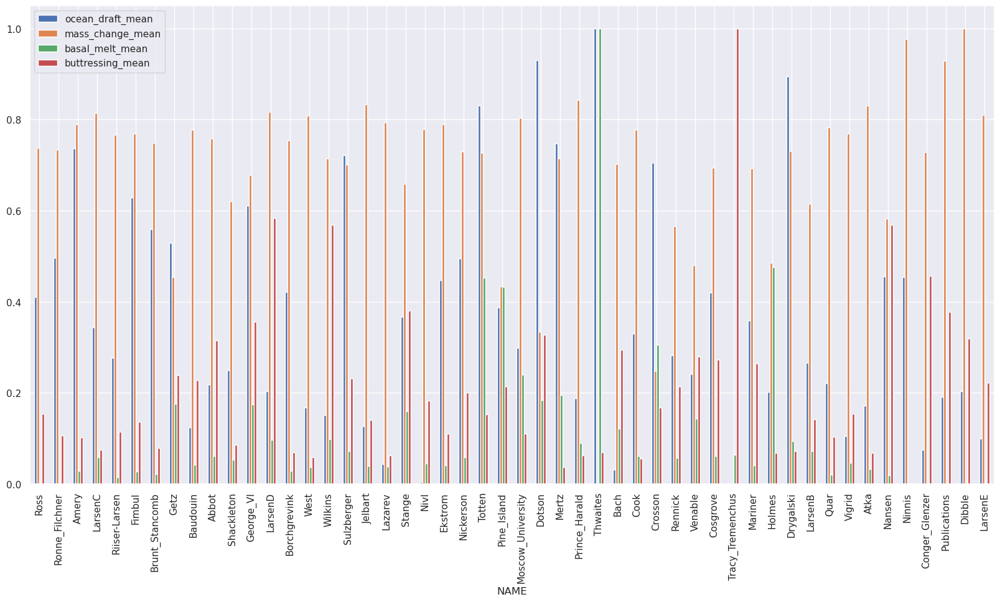

In [15]:
# apply normalization techniques
cols = [
    # "area_km",
    "ocean_draft_mean",
    "mass_change_mean",
    # "ice_vel_mean",
    "basal_melt_mean",
    "buttressing_mean",
]
df = ice_shelves.iloc[0:50].copy()
for column in cols:
    df[column] = (df[column] - df[column].min()) / (df[column].max() - df[column].min())

df[cols+["NAME"]].plot(x="NAME", kind="bar", figsize=(20, 10))

<Axes: xlabel='NAME'>

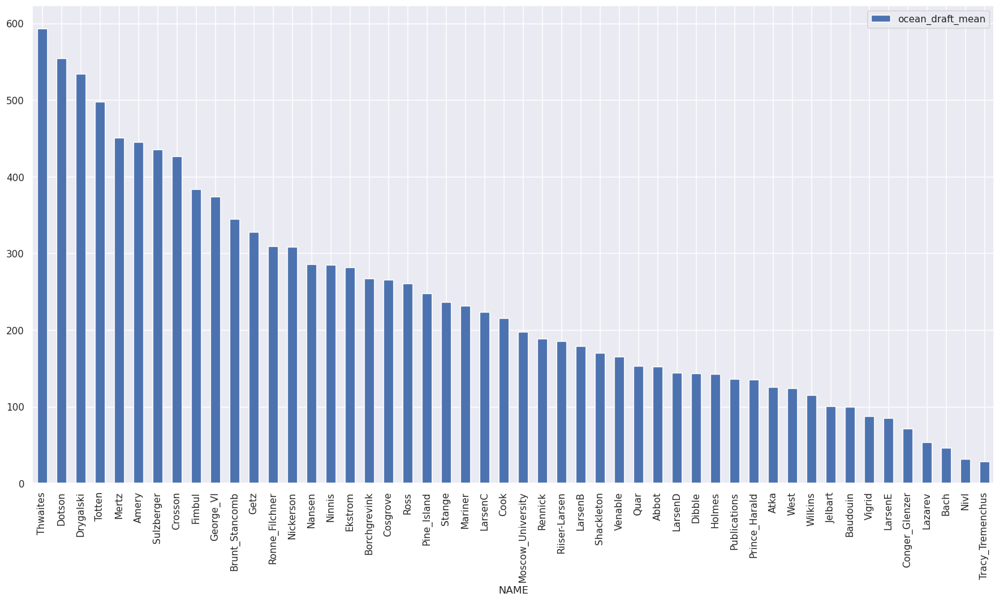

In [16]:
col = "ocean_draft_mean"
ice_shelves.iloc[0:50].sort_values(col, ascending=False).plot(x="NAME", y=col, kind="bar", figsize=(20, 10))

<Axes: xlabel='NAME'>

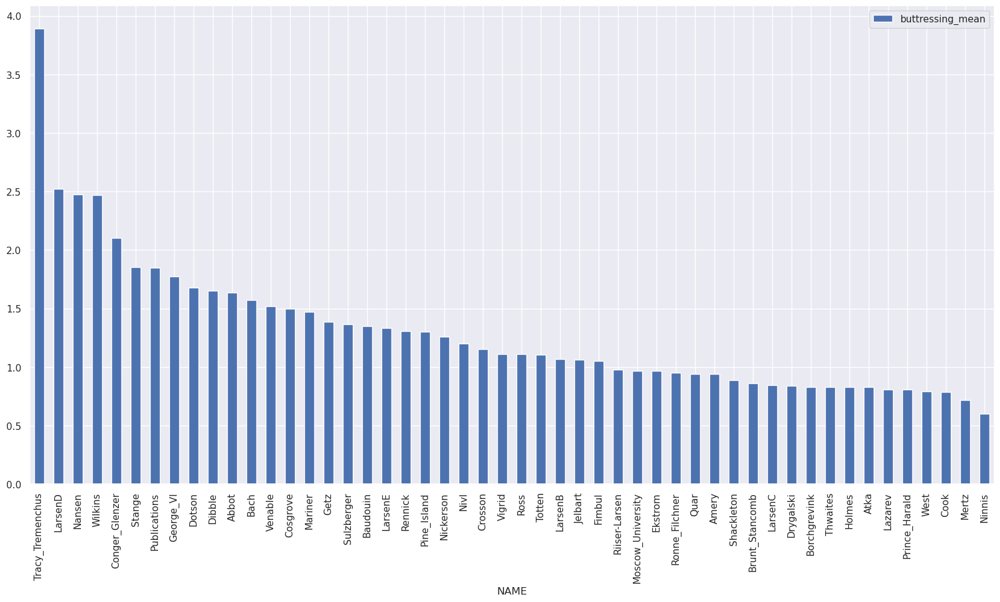

In [17]:
col = "buttressing_mean"
ice_shelves.iloc[0:50].sort_values(col, ascending=False).plot(x="NAME", y=col, kind="bar", figsize=(20, 10))

<Axes: xlabel='NAME'>

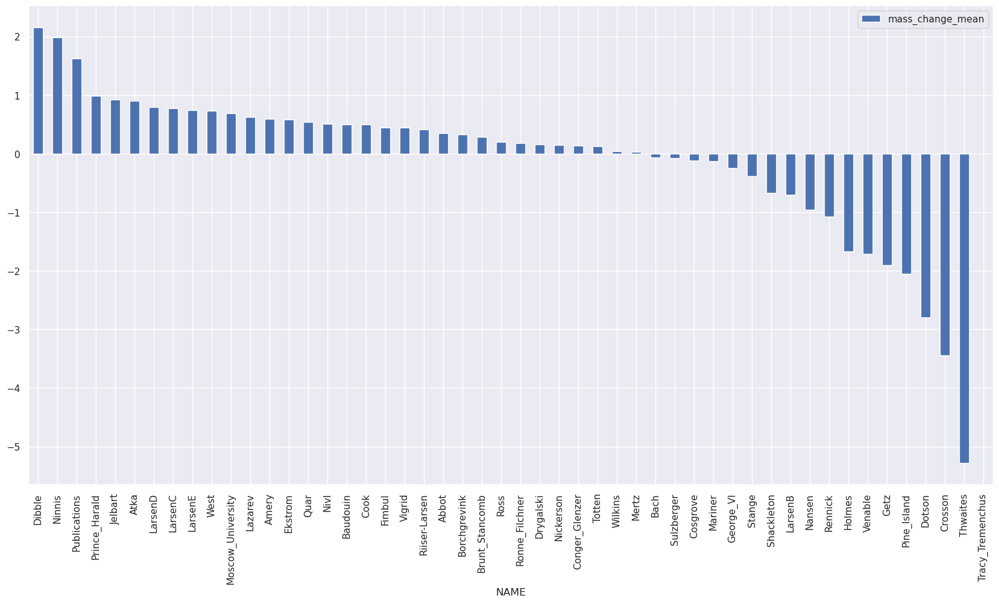

In [18]:
col = "mass_change_mean"
ice_shelves.iloc[0:50].sort_values(col, ascending=False).plot(x="NAME", y=col, kind="bar", figsize=(20, 10))

<Axes: xlabel='NAME'>

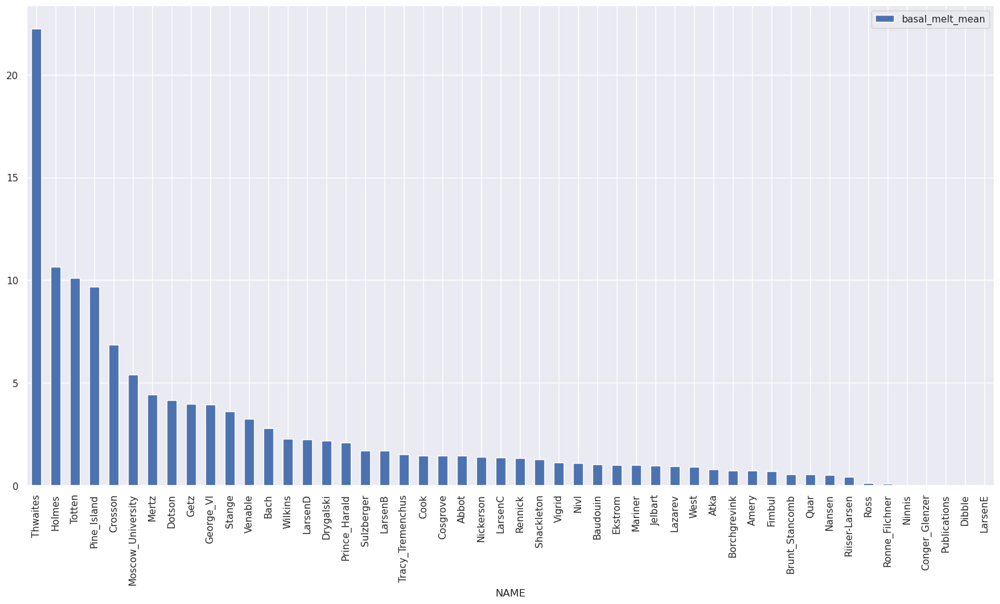

In [19]:
col = "basal_melt_mean"
ice_shelves.iloc[0:50].sort_values(col, ascending=False).plot(x="NAME", y=col, kind="bar", figsize=(20, 10))

In [20]:
ice_shelves.columns

Index(['NAME', 'Regions', 'TYPE', 'geometry', 'area_km', 'ocean_draft_mean',
       'ocean_draft_std', 'ocean_draft_max', 'ocean_draft_min',
       'ocean_draft_median', 'mass_change_mean', 'mass_change_std',
       'mass_change_max', 'mass_change_min', 'mass_change_median',
       'ice_vel_mean', 'ice_vel_std', 'ice_vel_max', 'ice_vel_min',
       'ice_vel_median', 'basal_melt_mean', 'basal_melt_std', 'basal_melt_max',
       'basal_melt_min', 'basal_melt_median', 'buttressing_mean',
       'buttressing_std', 'buttressing_max', 'buttressing_min',
       'buttressing_median', 'median_constraint_distance',
       'gravity_disturbance_rms', 'gravity_disturbance_stdev',
       'partial_topo_free_disturbance_rms',
       'partial_topo_free_disturbance_stdev', 'topo_free_disturbance_rms',
       'topo_free_disturbance_stdev', 'starting_gravity_rms',
       'starting_gravity_stdev', 'reg_rms', 'reg_stdev', 'res_rms',
       'res_stdev', 'error_rms', 'error_stdev',
       'residual_constraint

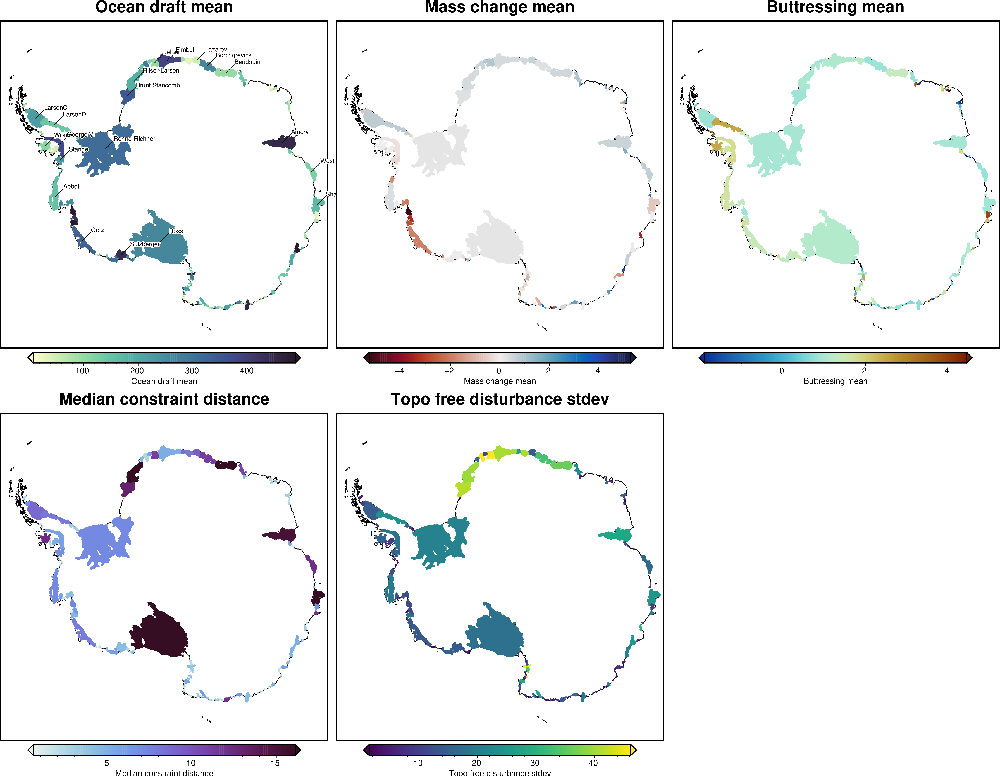

In [27]:
cols=[
    "ocean_draft_mean",
    "mass_change_mean",
    "buttressing_mean",
    "median_constraint_distance",
    "topo_free_disturbance_stdev"
]
cmap_kwargs = [
    dict(
        cmap="deep",
    ),
    dict(
        cmap="balance+h0",
        reverse=True,
        absolute=True,
    ),
    dict(
        cmap="roma",
        reverse=True,
    ),
    dict(
        cmap="dense",
    ),
    dict(
        cmap="viridis",
    ),
]
n_rows, n_cols = utils.square_subplots(len(cols))

for i, c in enumerate(cols):

    yshift_amount=-1
    xshift_amount=1

    if i == 0:
        fig=None
        origin_shift="initialize"
    elif i % n_cols == 0:
        origin_shift="both"
        xshift_amount=-(n_cols-1)
    else:
        origin_shift="x"
    # plot basemap with coastline and grounding lines
    fig = maps.basemap(
        region=regions.antarctica,
        title=c.capitalize().replace("_", " "),
        fig=fig,
        origin_shift=origin_shift,
        yshift_amount=yshift_amount,
        xshift_amount=xshift_amount,
        fig_height=15,
        coast=True,
    )
    # choose how many ice shelves to plot, sorted by area
    df = ice_shelves.iloc[0:].copy()

    # buffer each shelf by 10 km
    # df["geometry"] = df.buffer(10e3)

    # make colormap for ice shelf area
    pygmt.makecpt(
        series=utils.get_min_max(
            df[c],
            robust=cmap_kwargs[i].pop("robust") if "robust" in cmap_kwargs[i] else True,
            absolute=cmap_kwargs[i].pop("absolute") if "absolute" in cmap_kwargs[i] else False,
        ),
        background="o",
        **cmap_kwargs[i],
    )
    # plot ice shelves
    fig.plot(
        df,
        fill="+z",
        aspatial=f"Z={c}",
        close=True,
        cmap=True,
    )
    maps.add_colorbar(
        fig=fig,
        cbar_label=c.capitalize().replace("_", " "),
    )
    # maps.add_coast(fig=fig, pen="0.2p,black")
    # plot names
    if i == 0:
        ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:20])

fig.show()

In [23]:
type(ice_shelves.iloc[0:2].buffer(10e3))

geopandas.geoseries.GeoSeries

In [22]:
type(ice_shelves.iloc[0:2])

geopandas.geodataframe.GeoDataFrame

In [ ]:
df.iloc[0:1].buffer(10e3)

In [35]:
row

NAME                                                                                      Ross
Regions                                                                                   West
TYPE                                                                                        FL
geometry                                     POLYGON ((-240677.18377991652 -678259.00593521...
area_km                                                                               480428.0
ocean_draft_mean                                                                     260.65866
ocean_draft_std                                                                      166.91527
ocean_draft_max                                                                       899.8292
ocean_draft_min                                                                            0.0
ocean_draft_median                                                                   256.58667
mass_change_mean                                  

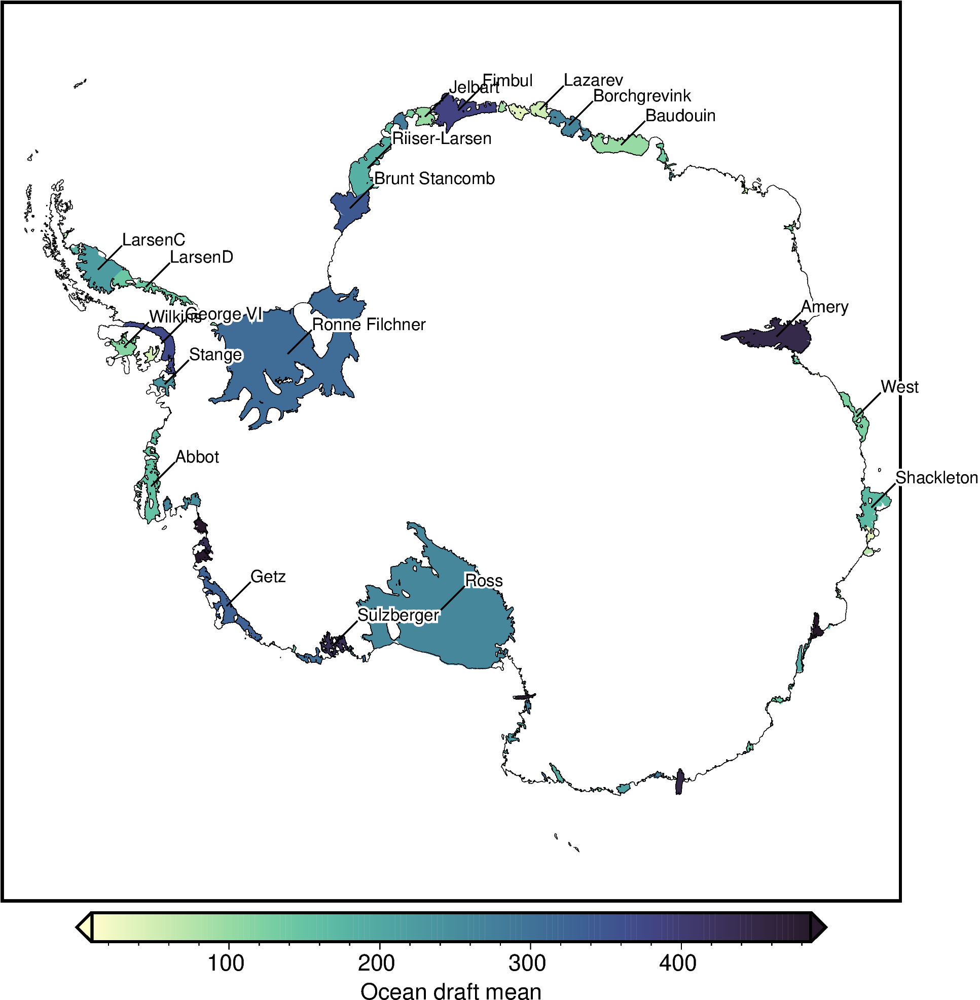

In [32]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:].copy()

# choose variable to plot
variable = "ocean_draft_mean"

# plot basemap with coastline and grounding lines
fig = maps.basemap(
    fig_height=15,
    region=regions.antarctica,
    # coast=True,
)

# make colormap for ice shelf area
pygmt.makecpt(
    cmap="deep",
    series=utils.get_min_max(df[variable], robust=True,),
    background="o",
)

# plot ice shelves
fig.plot(
    df,
    fill="+z",
    aspatial=f"Z={variable}",
    close=True,
    cmap=True,
)

maps.add_colorbar(
    fig=fig,
    cbar_label=variable.capitalize().replace("_", " "),
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:20])

fig.show()

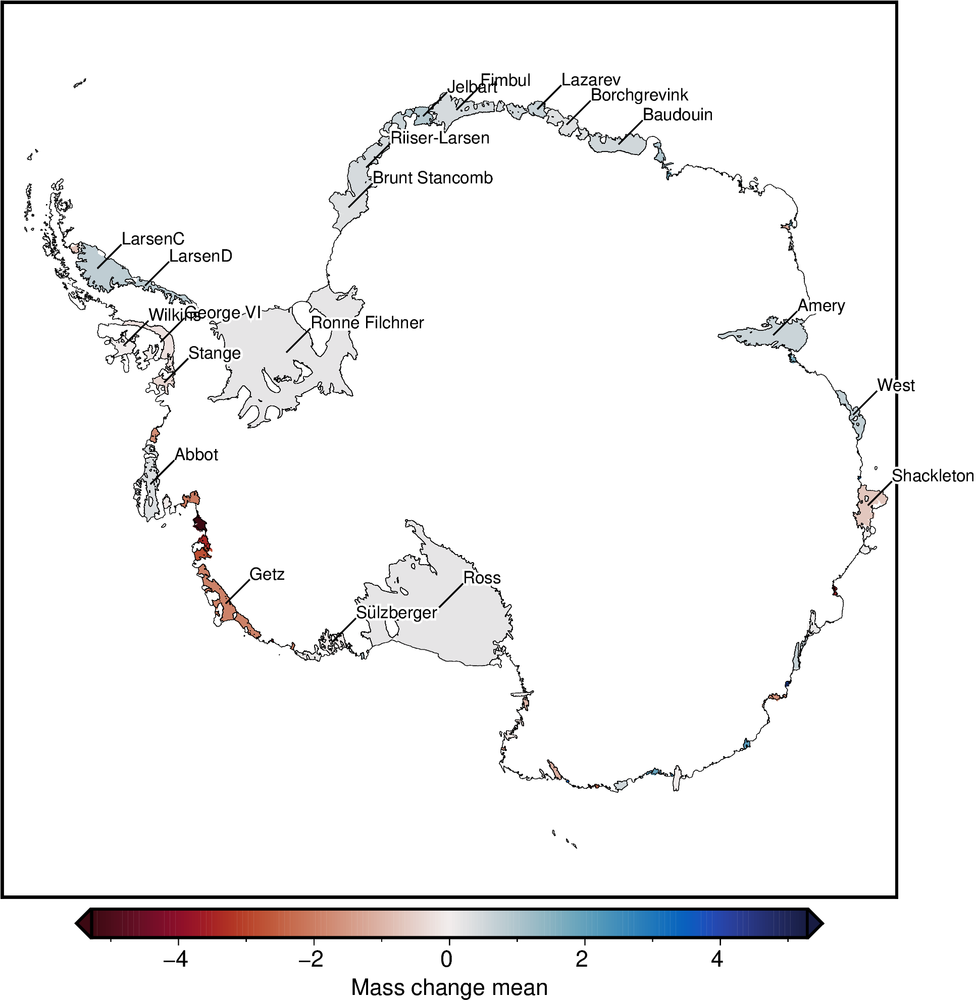

In [33]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:].copy()

# choose variable to plot
variable = "mass_change_mean"

# plot basemap with coastline and grounding lines
fig = maps.basemap(
    fig_height=15,
    region=regions.antarctica,
    # coast=True,
)

# make colormap for ice shelf area
pygmt.makecpt(
    cmap="balance+h0",
    reverse=True,
    series=utils.get_min_max(df[variable], absolute=True, robust=True,),
    background="o",
)

# plot ice shelves
fig.plot(
    df,
    fill="+z",
    aspatial=f"Z={variable}",
    close=True,
    cmap=True,
)

maps.add_colorbar(
    fig=fig,
    cbar_label=variable.capitalize().replace("_", " "),
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:20])

fig.show()

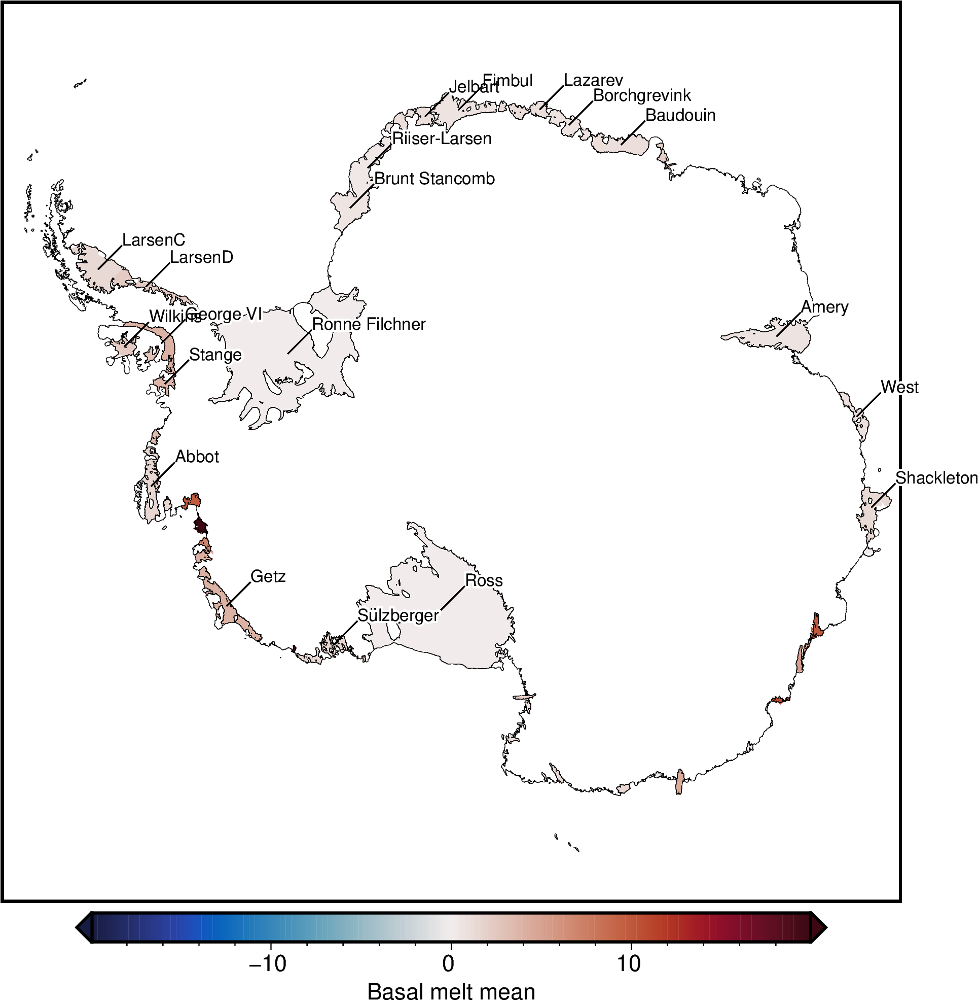

In [35]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:].copy()

# choose variable to plot
variable = "basal_melt_mean"

# plot basemap with coastline and grounding lines
fig = maps.basemap(
    fig_height=15,
    region=regions.antarctica,
    # coast=True,
)

# make colormap for ice shelf area
pygmt.makecpt(
    cmap="balance+h0",
    series=utils.get_min_max(df[variable], robust=True, absolute=True),
    background="o",
)

# plot ice shelves
fig.plot(
    df,
    fill="+z",
    aspatial=f"Z={variable}",
    close=True,
    cmap=True,
)

maps.add_colorbar(
    fig=fig,
    cbar_label=variable.capitalize().replace("_", " "),
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:20])

fig.show()

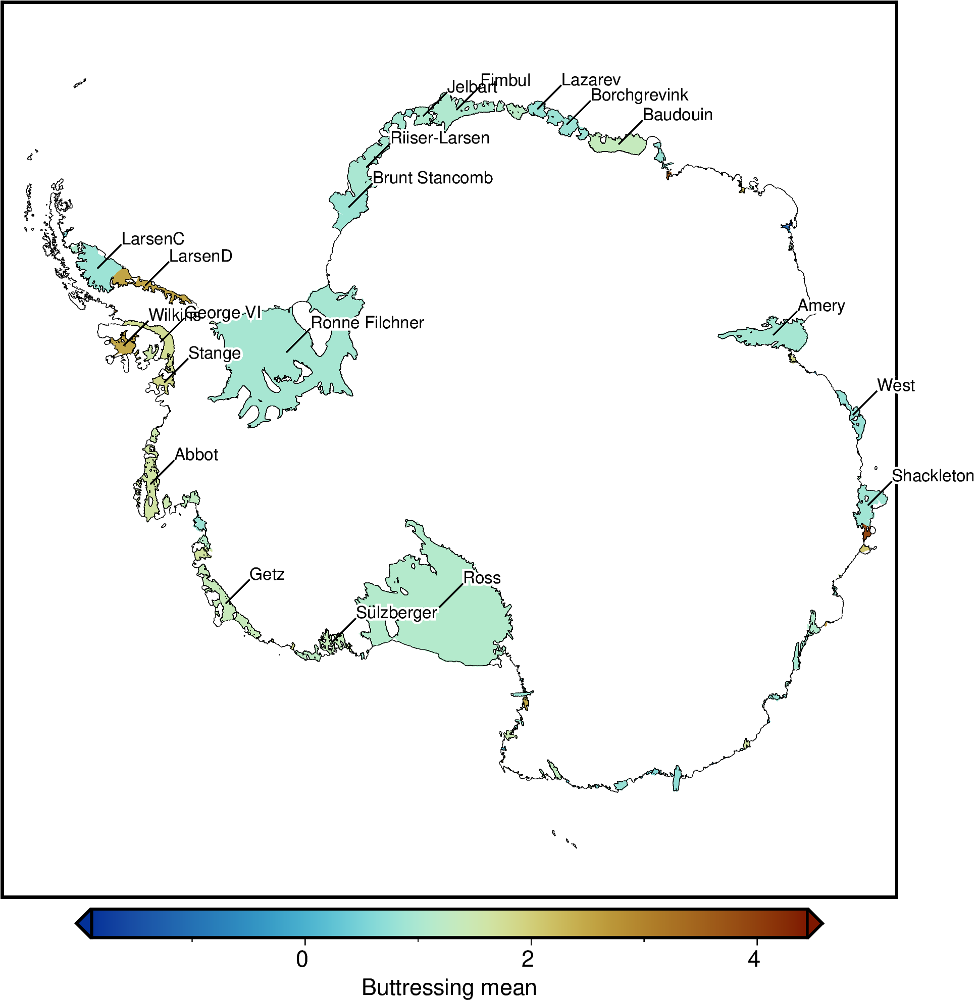

In [41]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:].copy()

# choose variable to plot
variable = "buttressing_mean"

# plot basemap with coastline and grounding lines
fig = maps.basemap(
    fig_height=15,
    region=regions.antarctica,
    # coast=True,
)

# make colormap for ice shelf area
pygmt.makecpt(
    cmap="roma",
    series=utils.get_min_max(df[variable], robust=True),
    # series=[0, 1],
    reverse=True,
    background="o",
)

# plot ice shelves
fig.plot(
    df,
    fill="+z",
    aspatial=f"Z={variable}",
    close=True,
    cmap=True,
)

maps.add_colorbar(
    fig=fig,
    cbar_label=variable.capitalize().replace("_", " "),
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:20])

fig.show()

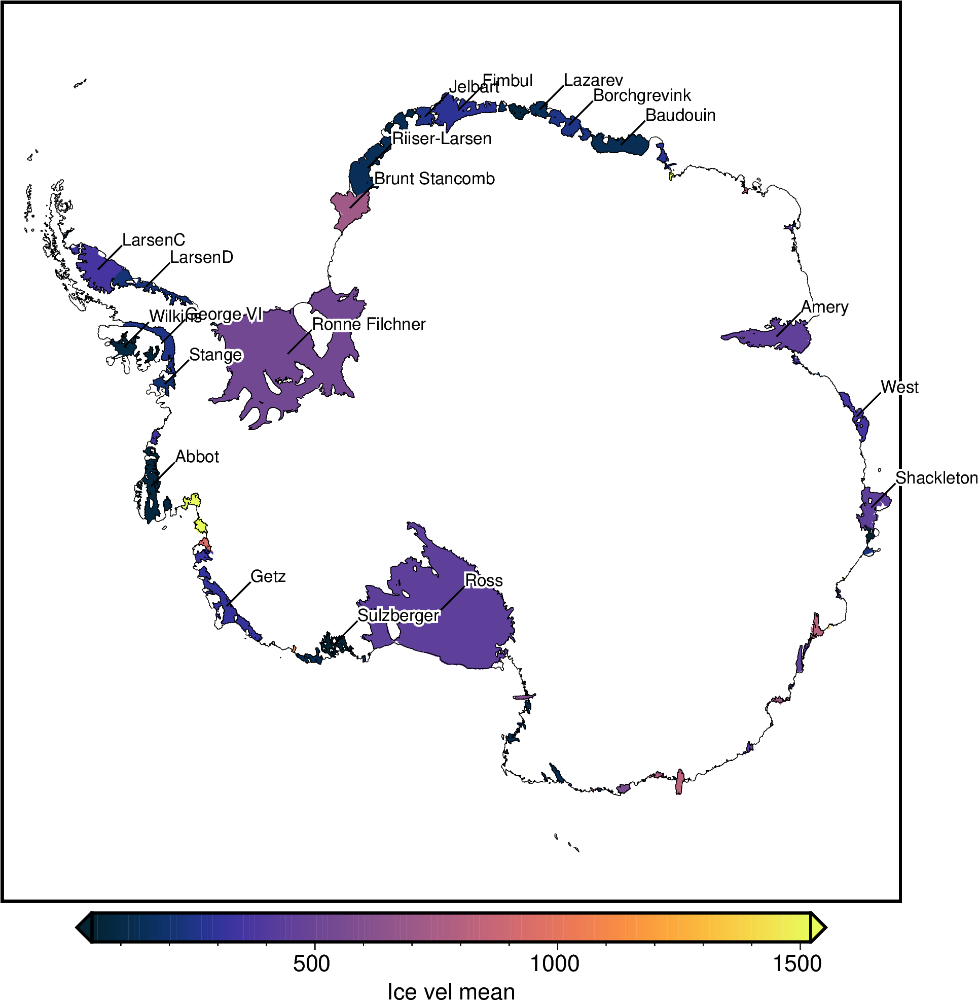

In [46]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:].copy()

# choose variable to plot
variable = "ice_vel_mean"

# plot basemap with coastline and grounding lines
fig = maps.basemap(
    fig_height=15,
    region=regions.antarctica,
    # coast=True,
)

# make colormap for ice shelf area
pygmt.makecpt(
    cmap="thermal",
    series=utils.get_min_max(df[variable], robust=True),
    background="o",
)

# plot ice shelves
fig.plot(
    df,
    fill="+z",
    aspatial=f"Z={variable}",
    close=True,
    cmap=True,
)

maps.add_colorbar(
    fig=fig,
    cbar_label=variable.capitalize().replace("_", " "),
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:20])

fig.show()

# Bathymetry point measurements

For onshore (grounded), get either Bedmap1, Bedmap2, Bedmap3, or all combined points. 
Alternatively, treat each gridcell (with a specified spacing) as a point measurement if it's grounded. 

For offshore, points are from IBCSO v2. Polygon measurements, such as swath bathymetry, are converted into points with a specified spacing, and merged with point measurements. This excludes gravity-inversion results from IBCSO.

Offshore (IBCSO) and onshore (Bedmap points or grid) are then merged. 

In [13]:
# shelf, median_min_dist, min_dist, bed_points = ice_shelf_stats.ice_shelf_constraints_distance_single(
#     ice_shelves.iloc[0],
#     bedmap_version="all",
#     spacing = 1e3,
#     grounded_as_points=True,
#     plot=True,
# )
# shelf

In [6]:
# ice_shelves_subset = ice_shelf_stats.ice_shelf_constraints_distance(
#     ice_shelves,
#     bedmap_version="all",
#     spacing = 1e3,
#     grounded_as_points=True,
#     # plot=True,
#     file_path="../../data/",
# )
# # ice_shelves = ice_shelves.assign(median_min_dist=ice_shelves_subset["median_min_dist"])
# ice_shelves_subset

# Ice shelf area

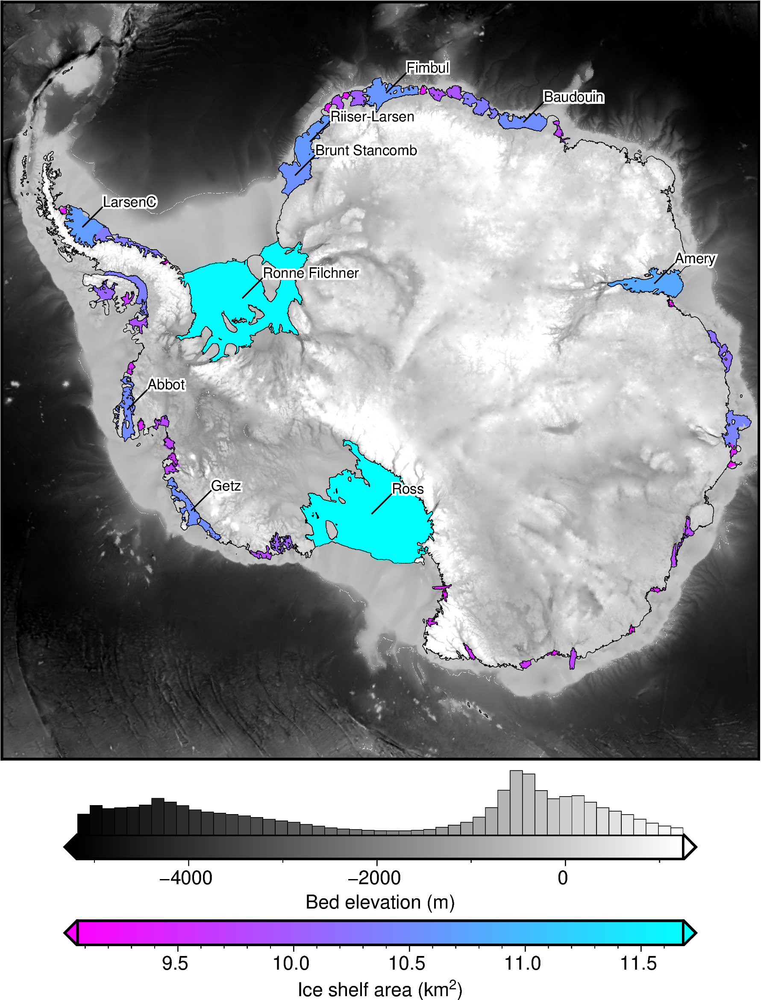

In [7]:
df = ice_shelves.iloc[0:50].copy()

df["log_area"] = np.log10(df.area)

# plot imagery and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    region=regions.antarctica,
    # transparency=40,
    cbar_label="Bed elevation (m)",
    hist=True,
    cbar_yoffset=1.5,
    robust=True,
)

# make colormap for ice shelf area
pygmt.makecpt(
    cmap="cool",
    reverse=True,
    series=utils.get_min_max(df.log_area),
    background="o",
)

# plot ice shelves
fig.plot(
    df,
    fill="+z",
    aspatial="Z=log_area",
    close=True,
    cmap=True,
)

# add colorbar with custom annotation values
# get even log-spaced values of colormap
log_values = np.linspace(df.log_area.min(), df.log_area.max(), 5)
# convert to area value rounded to nearest 1000
area_values = [int(round((10**x) / 1e6, -3)) for x in log_values]
# convert back to log-spaced values
log_values = [np.log10(x * 1e6) for x in area_values]
annots = [f"{loc} a {label}" for loc, label in zip(log_values, area_values)]
annots = "\n".join(annots)
with Path.open("../../plotting/tmp.txt", "w") as f:
    f.write(annots)

maps.add_colorbar(
    fig=fig,
    cbar_label="Ice shelf area (km@+2@+)",
    cbar_yoffset=3.2,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:10])

fig.show()

# Ice mass change

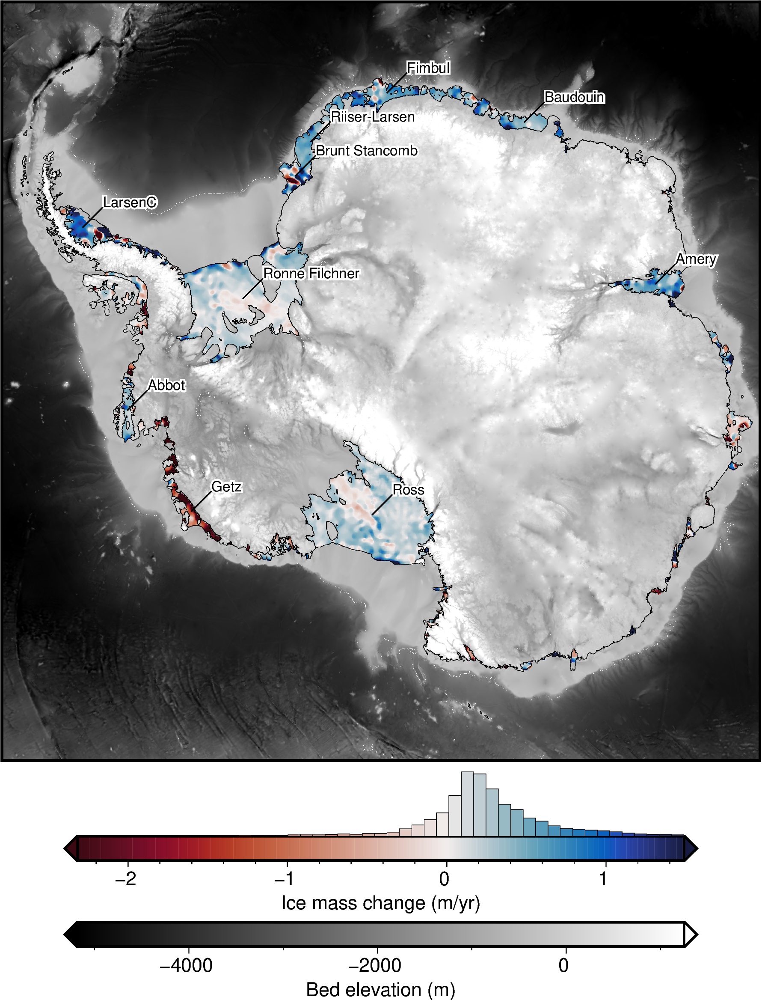

In [9]:
df = ice_shelves.iloc[0:50].copy()

# plot imagery and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    # transparency=40,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.2,
    robust=True,
)

# plot imagery and coastline
fig = maps.plot_grd(
    mass_change,
    fig=fig,
    origin_shift="no_shift",
    reverse_cpt=True,
    cmap="balance+h0",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Ice mass change (m/yr)",
    hist=True,
    cbar_yoffset=1.5,
    robust=True,
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:10])

fig.show()

# Basal melt

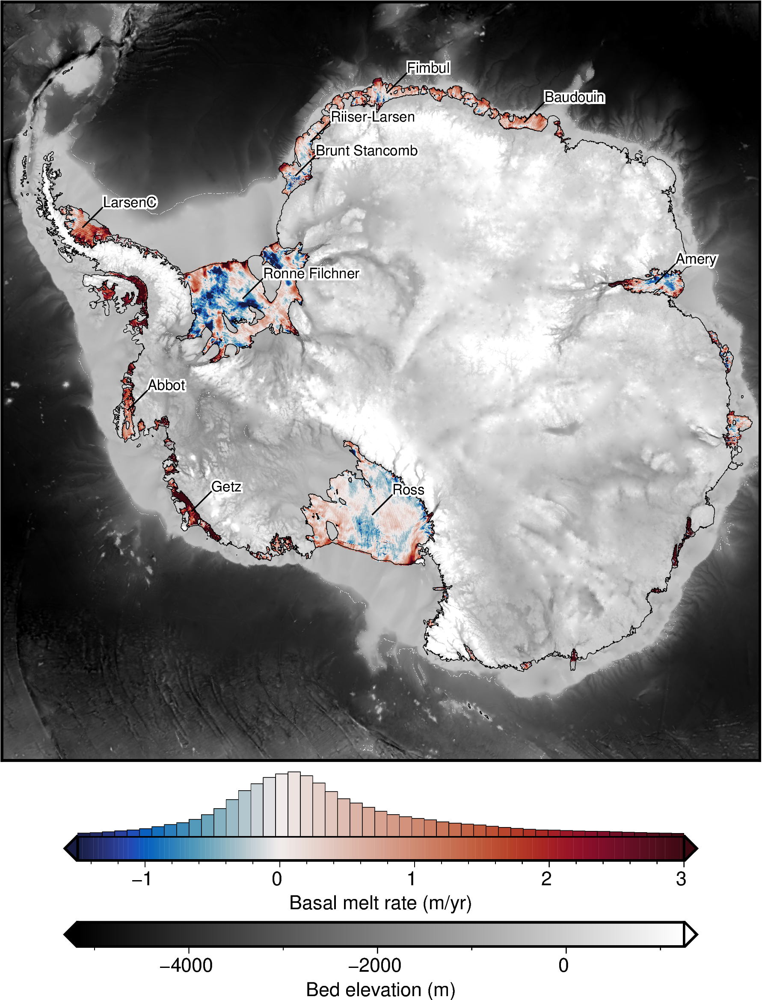

In [10]:
df = ice_shelves.iloc[0:50].copy()

# plot imagery and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    # transparency=40,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.2,
    robust=True,
)

# plot imagery and coastline
fig = maps.plot_grd(
    basal_melt,
    fig=fig,
    origin_shift="no_shift",
    cmap="balance+h0",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Basal melt rate (m/yr)",
    hist=True,
    cbar_yoffset=1.5,
    # robust=True,
    cpt_lims=[-1.5, 3],
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:10])

fig.show()

# Ice Shelf Ocean Draft (icebase to bed)

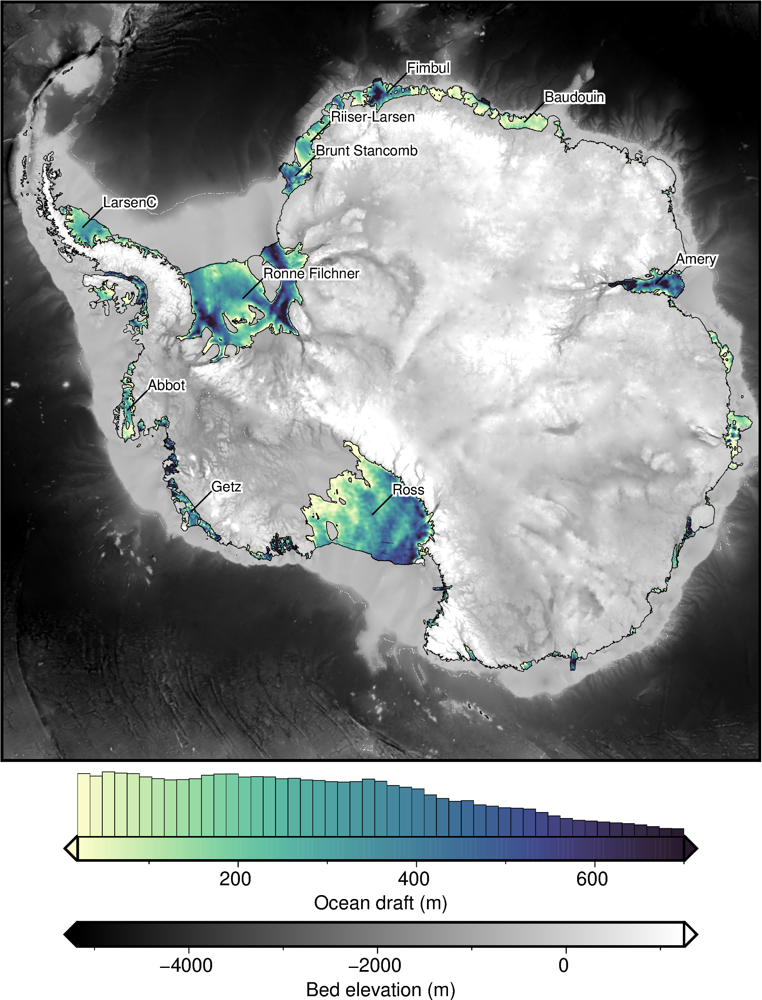

In [12]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:50].copy()

# plot imagery and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    # transparency=40,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.2,
    robust=True,
)

# plot imagery and coastline
fig = maps.plot_grd(
    ocean_draft_masked,
    fig=fig,
    origin_shift="no_shift",
    cmap="deep",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Ocean draft (m)",
    hist=True,
    cbar_yoffset=1.5,
    # robust=True,
    cpt_lims=[20, 700],
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:10])

fig.show()

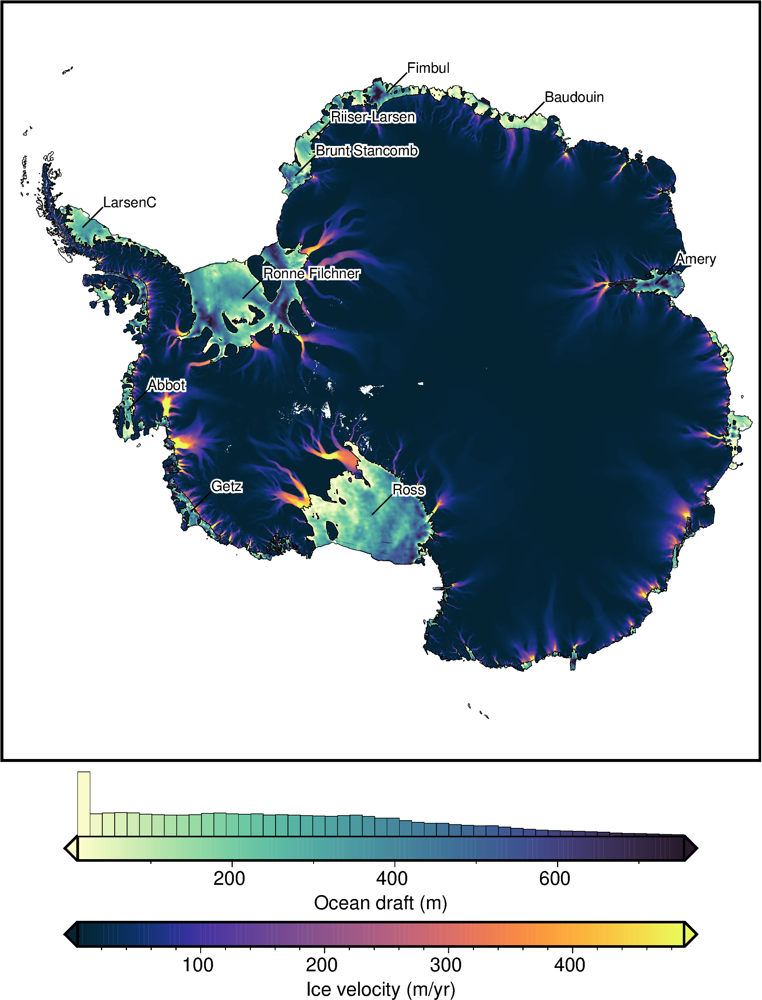

In [13]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:50].copy()

# plot ice velocity and coastline
lims = np.nanquantile(ice_vel, [0.04, 0.96])
fig = maps.plot_grd(
    ice_vel,
    cpt_lims=lims,
    cmap="thermal",
    fig_height=15,
    region=regions.antarctica,
    # transparency=40,
    cbar_yoffset=3.2,
    cbar_label="Ice velocity (m/yr)",
)

fig = maps.plot_grd(
    ocean_draft_masked,
    fig=fig,
    origin_shift="no_shift",
    cmap="deep",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Ocean draft (m)",
    hist=True,
    cbar_yoffset=1.5,
    robust=True,
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:10])

fig.show()

# Basal melt and ocean draft

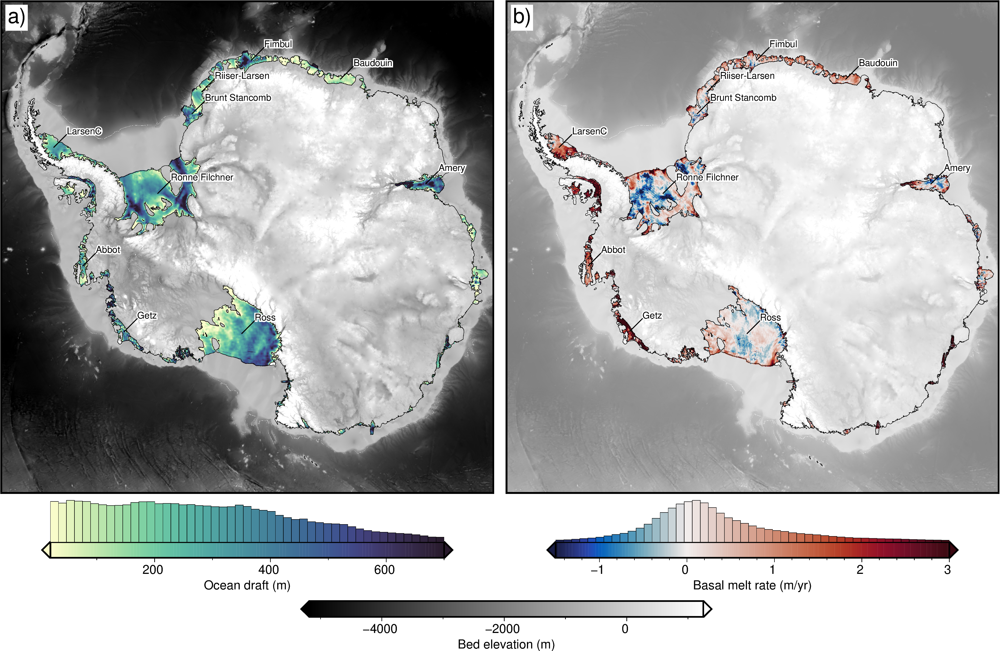

In [14]:
df = ice_shelves.iloc[0:50].copy()

# plot bed and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    # transparency=50,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.2,
    cbar_xoffset=7.5,
    robust=True,
    colorbar=False,
)

# plot ocean draft
fig = maps.plot_grd(
    ocean_draft_masked,
    fig=fig,
    origin_shift="no_shift",
    cmap="deep",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Ocean draft (m)",
    hist=True,
    cbar_yoffset=1.5,
    cpt_lims=[20, 700],
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:10])

fig.text(
    position="TL",
    justify="TL",
    text="a)",
    fill="white",
    font="18p,Helvetica,black",
    offset="j.2c/.2c",
    no_clip=True,
)

# plot bed and coastline
fig = maps.plot_grd(
    bed,
    fig=fig,
    origin_shift="xshift",
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    transparency=50,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.3,
    cbar_xoffset=-7.5,
    robust=True,
)

# plot basal melt
fig = maps.plot_grd(
    basal_melt,
    fig=fig,
    origin_shift="no_shift",
    cmap="balance+h0",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Basal melt rate (m/yr)",
    hist=True,
    cbar_yoffset=1.5,
    # robust=True,
    cpt_lims=[-1.5, 3],
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
ice_shelf_stats.plot_ice_shelf_names(fig, df.iloc[0:10])

fig.text(
    position="TL",
    justify="TL",
    text="b)",
    fill="white",
    font="18p,Helvetica,black",
    offset="j.2c/.2c",
    no_clip=True,
)

fig.show()